# STAX achieves spot completion while deciphering the complex tumor microenvironment

## Load package

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import scanpy as sc
import pandas as pd
import numpy as np
import torch
import dgl
import random
from scipy.sparse import csr_matrix
from sklearn.metrics import adjusted_rand_score as ari_score
from sklearn.metrics.cluster import normalized_mutual_info_score

In [4]:
import STA as sta

In [5]:
seed = 42
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
dgl.random.seed(seed)

In [6]:
sc.set_figure_params(dpi=300, figsize=(4, 4), frameon=False)    # TODO 是否画边框

## 10X Visium breast cancer domain identification

### load data

In [7]:
adata1 = sc.read_h5ad(f'./data/4Completion/align_Visium.h5ad')
adata1.obs_names_make_unique()
adata1.var_names_make_unique()
adata1

AnnData object with n_obs × n_vars = 3955 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'cell_type_colors', 'cell_type_sub_colors', 'in_tissue_colors', 'spatial'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw'

### Preprocess the data

In [8]:
data_list = [adata1]
batch_key = 'batch'
batch_names = ['adata1']

adata = sta.pp.process_adata(data_list, label=batch_key, keys=batch_names, n_top_features=5000, norm=True, scale='log', target_sum=1e4)
adata

View of AnnData object with n_obs × n_vars = 3955 × 5000
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub', 'original_index', 'spot_quality', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw'
    layers: 'counts', 'norm_log'

### Construct graph

In [9]:
rad_cutoff_list = [300]
adata, g = sta.pp.process_graph(adata, data_list, cutoff_list=rad_cutoff_list)

cal spatial net in data_list
------Calculating spatial graph...
The graph contains 23118 edges, 3955 cells.
5.8453 neighbors per cell on average.


### Train

In [10]:
path_results = f'./log/domain_Visium/'

In [11]:
adata_STAX = sta.model.STAX(adata=adata,
                            n_epoch=500,
                            batch_size=len(adata),
                            verbose=False,
                            gpu=0,
                            random_seed=42,
                            output_dir=path_results,
                            )

Epochs: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:26<00:00, 19.10it/s, recon_loss_mse=450.8623, kl_loss=8.3255, lr: 0.0]


In [12]:
adata_STAX

AnnData object with n_obs × n_vars = 3955 × 5000
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub', 'original_index', 'spot_quality', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'adj'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw', 'X_STAX'
    varm: 'gene_embedding'
    layers: 'counts', 'norm_log', 'impute'

### Clustering

In [13]:
sc.pp.neighbors(adata_STAX, use_rep='X_STAX')
sc.tl.umap(adata_STAX)

In [14]:
sc.tl.louvain(adata_STAX, resolution=0.3)

In [15]:
sc.tl.leiden(adata_STAX, resolution=0.2)

In [16]:
sta.tl.kmeans_cluster(adata_STAX, mode='KMeans', used_embedding='X_STAX', n_clusters=10)

AnnData object with n_obs × n_vars = 3955 × 5000
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub', 'original_index', 'spot_quality', 'batch', 'louvain', 'leiden', 'kmeans'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'adj', 'neighbors', 'umap', 'louvain', 'leiden'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw', 'X_STAX', 'X_umap'
    varm: 'gene_embedding'
    layers: 'counts', 'norm_log', 'impute'
    obsp: 'distances', 'connectivities'

### Visualize Results of full batch

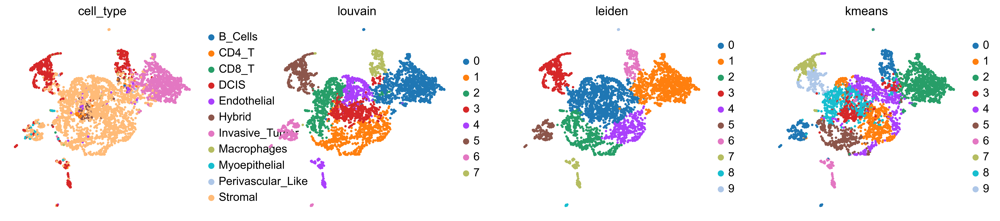

In [17]:
sc.pl.umap(adata_STAX, color=['cell_type', 'louvain', 'leiden', 'kmeans'])

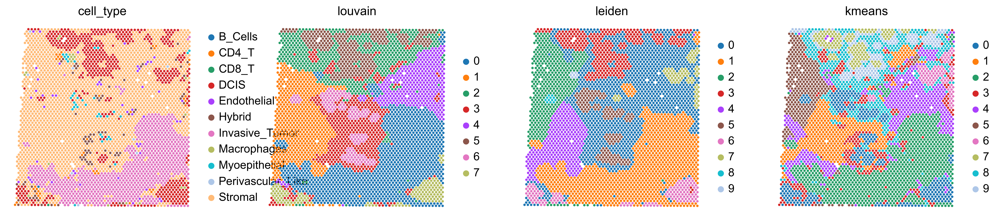

In [18]:
sc.pl.embedding(adata_STAX, color=['cell_type', 'louvain', 'leiden', 'kmeans'], basis='spatial')

## 10X Visium breast cancer spot completion

### load data

In [20]:
adata1 = sc.read_h5ad(f'./data/4Completion/align_Visium.h5ad')
adata1.obs_names_make_unique()
adata1.var_names_make_unique()
adata1

AnnData object with n_obs × n_vars = 3955 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'cell_type_colors', 'cell_type_sub_colors', 'in_tissue_colors', 'spatial'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw'

### make_fake_spot

In [21]:
adata_new = sta.pp.make_fake_spot(adata1, spatial_key='spatial', x_density=100, y_density=100, max_neigh=16)
adata_new

AnnData object with n_obs × n_vars = 13791 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub', 'spot_quality', 'Region'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw'

### Preprocess the count matrix

In [22]:
data_list = [adata_new]
batch_key = 'batch'
batch_names = ['adata_new']

adata = sta.pp.process_adata(data_list, label=batch_key, keys=batch_names, n_top_features=5000, norm=True, scale='log', target_sum=1e4)
adata

View of AnnData object with n_obs × n_vars = 13791 × 5000
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub', 'spot_quality', 'Region', 'original_index', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw'
    layers: 'counts', 'norm_log'

In [23]:
adata.uns['spatial'] = adata1.uns['spatial']

### Construct physical graph

In [24]:
rad_cutoff_list = [8]
adata, graph_physical = sta.pp.process_graph(adata, data_list, cutoff_list=rad_cutoff_list, model='KNN')

cal spatial net in data_list
------Calculating spatial graph...
The graph contains 110328 edges, 13791 cells.
8.0000 neighbors per cell on average.


### Construct image graph

#### use UNI model, the model can be downloaded in "https://huggingface.co/MahmoodLab/UNI", 
#### and the model path should be in './model_UNI/pytorch_model.bin'

In [14]:
adata = sta.pp.generate_image_embedding(adata=adata,
                             adata_name='CytAssist_FFPE_Human_Breast_Cancer',
                             image_use='hires',
                             coordinate_key='spatial',
                             row_width=112,
                             col_width=112,
                             batch_size=32,
                             device='cuda:0',
                             pca_components=50,
                             )

load vit model
start infer


Inference: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 431/431 [07:49<00:00,  1.09s/it]


In [16]:
rad_cutoff_list = [8]
adata, graph_image = sta.pp.process_graph(adata, data_list, cutoff_list=rad_cutoff_list, spatial_key='image_embedding_PCA', model='KNN')

cal spatial net in one adata
------Calculating spatial graph...
The graph contains 110328 edges, 13791 cells.
8.0000 neighbors per cell on average.


In [17]:
graph_physical

<COOrdinate sparse matrix of dtype 'float64'
	with 124119 stored elements and shape (13791, 13791)>

In [18]:
graph_image

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 124081 stored elements and shape (13791, 13791)>

In [19]:
graph_physical + graph_image

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 172293 stored elements and shape (13791, 13791)>

#### We can use different types of edges at will

In [50]:
from scipy.sparse import csr_matrix, vstack
adata.uns['adj'] = graph_physical
adata.uns['adj']

<COOrdinate sparse matrix of dtype 'float64'
	with 124119 stored elements and shape (13791, 13791)>

In [71]:
from scipy.sparse import csr_matrix, vstack
adata.uns['adj'] = graph_image
adata.uns['adj']

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 124081 stored elements and shape (13791, 13791)>

In [88]:
from scipy.sparse import csr_matrix, vstack
adata.uns['adj'] = graph_physical + graph_image
adata.uns['adj']

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 172293 stored elements and shape (13791, 13791)>

### train

In [89]:
path_results = f'./log/domain_Visium100/'

In [90]:
adata_STAX = sta.model.STAX(adata=adata,
                            n_epoch=500,
                            batch_size=len(adata),
                            verbose=False,
                            gpu=0,
                            random_seed=42,
                            output_dir=path_results,
                            )

Epochs: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:51<00:00,  9.75it/s, recon_loss_mse=453.7857, kl_loss=5.5454, lr: 0.0]


In [91]:
adata_STAX

AnnData object with n_obs × n_vars = 13791 × 5000
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub', 'spot_quality', 'Region', 'original_index', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'spatial', 'adj'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw', 'image_embedding', 'image_embedding_PCA', 'X_STAX'
    varm: 'gene_embedding'
    layers: 'counts', 'norm_log', 'impute'

### Only select the fake spot, and the impute or reconstructed expression in adata_STAX.obsm['impute']

In [93]:
adata_STAX = adata_STAX[adata_STAX.obs.loc[:, 'spot_quality'] == 'fake', :]
adata_STAX

View of AnnData object with n_obs × n_vars = 9836 × 5000
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub', 'spot_quality', 'Region', 'original_index', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'spatial', 'adj'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw', 'image_embedding', 'image_embedding_PCA', 'X_STAX'
    varm: 'gene_embedding'
    layers: 'counts', 'norm_log', 'impute'

### Clustering

In [94]:
sc.pp.neighbors(adata_STAX, use_rep='X_STAX')

In [95]:
sc.tl.umap(adata_STAX)

In [96]:
sc.tl.louvain(adata_STAX, resolution=0.4)

In [97]:
sc.tl.leiden(adata_STAX, resolution=0.3)

In [98]:
sta.tl.kmeans_cluster(adata_STAX, mode='KMeans', used_embedding='X_STAX', n_clusters=10)

E:\学习\6科研\论文\博士论文\STAX\code\STA\tools\clustering.py:79: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['1' '1' '1' ... '5' '5' '5']' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  adata.obs.loc[:, 'kmeans'] = adata.obs.loc[:, 'kmeans'].astype(str)


AnnData object with n_obs × n_vars = 9836 × 5000
    obs: 'in_tissue', 'array_row', 'array_col', 'B_Cells', 'CD4+_T_Cells', 'CD8+_T_Cells', 'DCIS_1', 'DCIS_2', 'Endothelial', 'Invasive_Tumor', 'IRF7+_DCs', 'LAMP3+_DCs', 'Macrophages_1', 'Macrophages_2', 'Mast_Cells', 'Myoepi_ACTA2+', 'Myoepi_KRT15+', 'Perivascular-Like', 'Prolif_Invasive_Tumor', 'Stromal', 'Stromal_&_T_Cell_Hybrid', 'T_Cell_&_Tumor_Hybrid', 'cell_type', 'cell_type_sub', 'spot_quality', 'Region', 'original_index', 'batch', 'louvain', 'leiden', 'kmeans'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'spatial', 'adj', 'neighbors', 'umap', 'louvain', 'leiden'
    obsm: 'X_pca', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'spatial', 'spatial_raw', 'image_embedding', 'image_embedding_PCA', 'X_STAX', 'X_umap'
    varm: 'gene_embedding'
    layers: 'counts', 'norm_log', 'impute'
    obsp: 'distances', 'connectivities

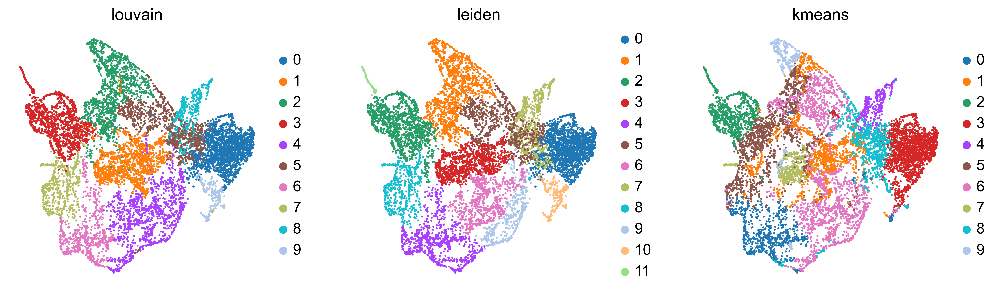

In [40]:
sc.pl.umap(adata_STAX, color=['louvain', 'leiden', 'kmeans'])

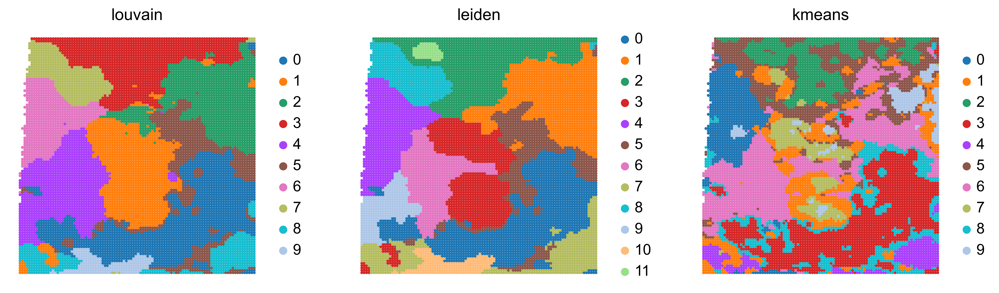

In [36]:
sc.pl.embedding(adata_STAX, color=['louvain', 'leiden', 'kmeans'], basis='spatial', size=25)